In [2]:
#Import Packages

import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

import matplotlib.pyplot as plt
import seaborn as sns

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [18]:
df = pd.read_csv(r'../../../Data/Survey/cleaned_survey_402.csv')
df

,id,age,gender,monthly_income,tertiary_student,instituition,region,location,type_of_student,type_of_employment,frequently_used_mot,frequency_mot,preferred_mot,reason_least_preferred_mot,circ_least_preferred_mot,factors_mot_ranking,overall_avg_spending,research,comfortable,explore,frequently_used_mot_cnt,most_preferred_mot,least_preferred_mot,most_impt_factor,least_impt_factor,frequency_bus,waiting_time_bus,reason_bus,affordable_bus,accesible_bus,safe_bus,prevent_bus,chartered_bus,occasion_chartered_bus,price_chartered_bus,frequency_mrt,spend_mrt,reason_mrt,mrt_lines,affordable_mrt,accessible_mrt,waiting_mrt,safe_mrt,prevent_mrt,mrt_lines_cnt,frequency_taxi,waiting_time_taxi,way_hail,reason_taxi,preference_rank_taxi,affordable_taxi,accessible_taxi,safe_taxi,customer_service_taxi,difficulties_taxi,prevent_taxi,most_preferred_taxi,least_preferred_taxi,frequency_ride_hailing,reason_ride_hailing,ride_hailing_type,preference_rank_ride_hailing,reason_ride_hailing_company,affordable_ride_hailing,safe_ride_hailing,customer_service_ride_hailing,difficulties_ride_hailing,prevent_ride_hailing,used_ride_hailing_svc_cnt,most_preferred_ride_hailing,least_preferred_ride_hailing,own_driving_license,rent_before,preference_rank_rental_car,reason_rental_car_company,frequency_rental,duration_rental,reason_rental_car,difficulties_rental_car,difficulties_reason_rental_car,convenient_rental_car,convenient_reason_rental_car,affordable_rental_car,reasonable_rental_car,type_rental_car,perception_rental_car,max_price_rental_car,biz_model_rental,biz_model_reason_rental,biz_model_important_rental,prevent_rental,type_rental_car_heard_cnt,aware_cdg,used_cdg,accessibility_cdg,cs_cdg,cost_cdg,comfort_cdg,reliability_cdg,info_cdg,overall_rating_cdg,perception_cdg,improvement_cdg,incentives_cdg,aware_cdg_cnt,used_cdg_cnt
0,4,22 - 25,Female,Below $500,Yes,SMU,North,Yishun,Full-time Student,NaN,"['MRT', 'Bus']",Once a week,"['Ride-hailing services', 'MRT', 'Bus\xa0', 'T...",Expensive to rent a car. Singapore too hot to ...,When there is no choice,"['Physical Accessibility', 'Price', 'Safety', ...",$50-$100,9.0,9.0,1.0,2,Ride-hailing services,"Others: Cycle, Walk, Drive",Physical Accessibility,Service Information,None,Less than 10 minutes,"['When travelling to the nearby MRT Stations',...",Agree,Strongly Agree,Strongly Agree,"['Bulky items', 'Long waiting time', 'Long tra...",No,NaN,I don't know,3-4 days per week,45-60 mins,"['To get to work/school', ""To\xa0directly get ...",['North-South Line (Red Line)'],Agree,Strongly Agree\n,Strongly Agree\n,Agree,['When I’m late and rushing to get to my desti...,1,Never,5-10 mins,"['Flag down', 'Use grab app ']","['When it is more accessible', 'When there is ...","['ComfortDelgro', 'Trans-Cab', 'SMRT Taxi', 'P...",Neutral,Neutral,Agree,Neutral,Yes when it is late at night. From SMU back to...,"['Too costly', 'Private hire is cheaper']",ComfortDelgro,Yellow-Top Taxi,Once a week,"['When there is a promotion', 'When it is more...","['Grab', 'Gojek']","['Grab', 'Gojek', 'Ryde', 'Comfort DelGro', 'O...","['Familiar with the software, easy user interf...",Agree,Agree,Neutral,Nil,"['Poor driving', 'Long wait time']",2,Grab,Tada Mobility,Yes,No,[''],[''],NaN,NaN,[''],NaN,NaN,NaN,NaN,NaN,NaN,"['Tribecar', 'Grabcar Rental', 'BlueSG']",NaN,$3.01 - $5,['Free-floating'],['Convenience'],6.0,"['Inconvenient Pickup Locations', 'Costly', 'S...",3,['Taxi'],['Taxi'],Somewhat satisfied,Neutral,Somewhat dissatisfied,Somewhat satisfied,Somewhat satisfied,Neutral,Neutral,Just a taxi company,Not very sure don’t take them often,"['More locations to rent from', 'Competitive p...",1,1
1,5,22 - 25,Female,Below $500,Yes,SMU,West,Bukit Batok,Full-time Student,Employed Part-time,"['Bus', 'MRT', 'Taxi', 'Ride-hailing services']",3 - 4 days a week,"['Ride-hailing services', 'Taxi', 'Bus\xa0', '...",Car Rentals are expensive. Destination too far...,If it's nearby or if car rentals are the cheap...,"['Travel Time', 'Price', 'Waiting Time', 'Comf...",More than 

# Data Cleaning

In [19]:
# drop open ended columns & id
columns = ['difficulties_ride_hailing','reason_least_preferred_mot', 'circ_least_preferred_mot', 'occasion_chartered_bus', 'price_chartered_bus', 'difficulties_taxi', 'convenient_reason_rental_car', 'perception_cdg', 'improvement_cdg', 'reason_ride_hailing_company', 'difficulties_reason_rental_car', 'perception_rental_car', 'id']
df.drop(columns, axis=1, inplace = True )


In [20]:
# replace [ & ] with empty
col_name = ['frequently_used_mot', 'preferred_mot', 'factors_mot_ranking', 'reason_bus', 'prevent_bus', 'reason_mrt', 
            'mrt_lines', 'prevent_mrt', 'way_hail', 'reason_taxi', 'preference_rank_taxi', 'prevent_taxi', 'reason_ride_hailing',
           'ride_hailing_type', 'preference_rank_ride_hailing', 'prevent_ride_hailing',
           'preference_rank_rental_car', 'reason_rental_car_company', 'reason_rental_car', 'type_rental_car', 'biz_model_rental', 
           'biz_model_reason_rental', 'prevent_rental', 'aware_cdg', 'used_cdg', 'incentives_cdg']

for i in col_name:
    df[i] = df[i].str.replace(r"'", '')
    df[i] = df[i].str.replace(r'[', '')
    df[i] = df[i].str.replace(r']', '')

In [21]:
lst_col = ['reason_bus', 'reason_mrt', 'reason_taxi', 'reason_ride_hailing', 'reason_rental_car_company', 'reason_rental_car']
for i in lst_col:
    df = df.assign(**{i:df[i].str.split(';')})

In [22]:
#df[['reason_bus', 'reason_mrt', 'reason_taxi', 'reason_ride_hailing', 'reason_rental_car_company', 'reason_rental_car']]

In [23]:
# drop rows if not tertiary_student
df.drop(df.index[df['tertiary_student'] == 'No'], inplace = True)
# drop rows if missing tertiary_student
df.dropna(subset=['tertiary_student'], inplace = True)

In [24]:
df.isnull().sum()

age                                0
gender                             0
monthly_income                     0
tertiary_student                   0
instituition                       0
region                             0
location                           0
type_of_student                   20
type_of_employment               286
frequently_used_mot                0
frequency_mot                      0
preferred_mot                      0
factors_mot_ranking                0
overall_avg_spending               0
research                           0
comfortable                        0
explore                            0
frequently_used_mot_cnt            0
most_preferred_mot                 0
least_preferred_mot                0
most_impt_factor                   0
least_impt_factor                  0
frequency_bus                      0
waiting_time_bus                   0
reason_bus                         0
affordable_bus                     0
accesible_bus                      0
s

In [25]:
#Check for missing values
df.isnull().sum() 
#Check for missing col 
df.columns[df.isnull().any()]

Index(['type_of_student', 'type_of_employment', 'frequency_rental',
       'duration_rental', 'difficulties_rental_car', 'convenient_rental_car',
       'affordable_rental_car', 'reasonable_rental_car',
       'max_price_rental_car', 'accessibility_cdg', 'cs_cdg', 'cost_cdg',
       'comfort_cdg', 'reliability_cdg', 'info_cdg', 'overall_rating_cdg'],
      dtype='object')

In [26]:
df['type_of_student'].mode()
df['type_of_employment'].mode()

0    Employed Part-time
dtype: object

In [27]:
# fill missing values
df['frequency_rental'].fillna('0', inplace = True)
df['duration_rental'].fillna('0', inplace = True)
df['difficulties_rental_car'].fillna('Have not rent before', inplace = True)
df['convenient_rental_car'].fillna('Have not rent before', inplace = True)
df['affordable_rental_car'].fillna('Have not rent before', inplace = True)
df['reasonable_rental_car'].fillna('Have not rent before', inplace = True)
df['max_price_rental_car'].fillna('$3.01 - $5', inplace = True)
df['accessibility_cdg'].fillna('Somewhat satisfied', inplace = True)
df['cs_cdg'].fillna('Somewhat satisfied', inplace = True)
df['cost_cdg'].fillna('Neutral', inplace = True)
df['comfort_cdg'].fillna('Somewhat satisfied', inplace = True)
df['reliability_cdg'].fillna('Somewhat satisfied', inplace = True)
df['info_cdg'].fillna('Somewhat satisfied', inplace = True)
df['overall_rating_cdg'].fillna('Somewhat satisfied', inplace = True)
df['type_of_student'].fillna('Full-time Student', inplace = True)
df['type_of_employment'].fillna('Not employed', inplace = True)

In [28]:
df.columns[df.isnull().any()]

Index([], dtype='object')

In [29]:
df.to_csv(r'../../../Data/Survey/cleaned_334.csv', index=False)

# Further cleaning in excel

In [117]:
df = pd.read_csv(r'../../../Data/Survey/cleaned_334_edited.csv')
df.head()

,age,gender,monthly_income,tertiary_student,instituition,region,location,type_of_student,type_of_employment,frequently_used_mot,frequency_mot,preferred_mot,factors_mot_ranking,overall_avg_spending,research,comfortable,explore,frequently_used_mot_cnt,most_preferred_mot,least_preferred_mot,most_impt_factor,least_impt_factor,frequency_bus,waiting_time_bus,reason_bus,reason_bus_travel_to_mrt_stations,reason_bus_recreation_destination,reason_bus_for_work_school,reason_bus_dont_feel_like_walking,reason_bus_no_other_choice,reason_bus_to_access_places_where_MRT_unavailable,affordable_bus,accesible_bus,safe_bus,prevent_bus,chartered_bus,frequency_mrt,spend_mrt,reason_mrt,reason_mrt_for_work_school,reason_mrt_recreation_destination,reason_mrt_to_bus_stop,reason_mrt_when_no_car,reason_mrt_to_visit_girlfriend,reason_mrt_when_late,reason_mrt_to_go_home,reason_mrt_to_pass_items_friends,mrt_lines,affordable_mrt,accessible_mrt,waiting_mrt,safe_mrt,prevent_mrt,mrt_lines_cnt,frequency_taxi,waiting_time_taxi,way_hail,reason_taxi,reason_taxi_more_accessible,reason_taxi_promotion,reason_taxi_cheaper,reason_taxi_convenient,reason_taxi_comfort_of_privacy,reason_taxi_travel_urgently,reason_taxi_no_choices,reason_taxi_no_last_bus_train,reason_taxi_drinking,reason_taxi_claimable,preference_rank_taxi,affordable_taxi,accessible_taxi,safe_taxi,customer_service_taxi,prevent_taxi,most_preferred_taxi,least_preferred_taxi,frequency_ride_hailing,reason_ride_hailing,reason_ride_hailing_promotion,reason_ride_hailing_easy_booking,reason_ride_hailing_convenient,reason_ride_hailing_accessible,reason_ride_hailing_ comfort_of_privacy,reason_ride_hailing_important_matters,reason_ride_hailing_rushing,ride_hailing_type,preference_rank_ride_hailing,affordable_ride_hailing,safe_ride_hailing,customer_service_ride_hailing,prevent_ride_hailing,used_ride_hailing_svc_cnt,most_preferred_ride_hailing,least_preferred_ride_hailing,own_driving_license,rent_before,preference_rank_rental_car,reason_chosen_rental_car_company,reason_chosen_rental_car_company_convenient,reason_chosen_rental_car_company_cheap,reason_chosen_rental_car_company_reasonable_fair_policies,reason_chosen_rental_car_company_overseas,reason_chosen_rental_car_company_ pplate,reason_chosen_rental_car_company_insurance_coverage,reason_chosen_rental_car_company_hourly_rental,frequency_rental,duration_rental,reason_rental_car,reason_rental_car_convenience,reason_rental_car_car_too_costly,reason_rental_car_occasions,reason_rental_car_lesser_liabilities,reason_rental_car_practice_driving,difficulties_rental_car,convenient_rental_car,affordable_rental_car,reasonable_rental_car,type_rental_car,max_price_rental_car,biz_model_rental,biz_model_reason_rental,biz_model_important_rental,prevent_rental,type_rental_car_heard_cnt,aware_cdg,used_cdg,accessibility_cdg,cs_cdg,cost_cdg,comfort_cdg,reliability_cdg,info_cdg,overall_rating_cdg,incentives_cdg,aware_cdg_cnt,used_cdg_cnt
0,22 - 25,Female,Below $500,Yes,SMU,North,Yishun,Full-time Student,Not employed,"MRT, Bus",Once a week,"Ride-hailing services, MRT, Bus\xa0, Taxi, Car...","Physical Accessibility, Price, Safety, Reliabi...",$50-$100,9,9,1,2,Ride-hailing services,"Others: Cycle, Walk, Drive",Physical Accessibility,Service Information,None,Less than 10 minutes,"When travelling to the nearby MRT Stations, Di...",1,0,1,0,0,0,Agree,Strongly Agree,Strongly Agree,"Bulky items, Long waiting time, Long travel time",No,3-4 days per week,45-60 mins,"To get to work/school, ""To\xa0directly get to ...",1,1,0,0,0,0,0,0,North-South Line (Red Line),Agree,Strongly Agree\r\n,Strongly Agree\r\n,Agree,When Iâ€™m late and rushing to get to my desti...,1,Never,5-10 mins,"Flag down, Use grab app","When it is more accessible, When there is a pr...",1,1,0,0,0,0,0,0,0,0,"ComfortDelgro, Trans-Cab, SMRT Taxi, Premier T...",Neutral,Neutral,Agree,Neutral,"Too costly, Private hire is cheaper",ComfortDelgro,Yellow-Top Taxi,Once a week,"When there is a promotion, When it is more acc...",1,0,0,1,0,0,0,"Grab,

In [118]:
len(df.columns)

136

# Label Encoding

In [119]:
def transform_agree_disagree(x):
    if x == 'Strongly Disagree':
        return -2
    elif x == 'Disagree':
        return -1
    elif x == 'Neutral':
        return 0
    elif x == 'Agree':
        return 1
    else:
        return 2

In [120]:
def transform_yes_no(x):
    if x == 'Yes':
        return 1
    elif x == 'No':
        return 0
    else:
        return -1

In [121]:
bin_features = ['own_driving_license', 'rent_before']
train_bin = df[bin_features]
train_bin['own_driving_license'] = df['own_driving_license'].apply(transform_yes_no)
train_bin['rent_before'] = df['rent_before'].apply(transform_yes_no)
train_bin = train_bin.astype('int64')
train_bin.head()

C:\Users\user\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\user\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


,own_driving_license,rent_before
0,1,0
1,1,1
2,1,0
3,0,0
4,0,0


In [122]:
agree_disagree_col = ['affordable_bus', 'accesible_bus', 'safe_bus', 'affordable_mrt', 'accessible_mrt', 'waiting_mrt', 'safe_mrt',
                     'affordable_taxi', 'accessible_taxi', 'safe_taxi', 'customer_service_taxi',
                      'affordable_ride_hailing', 'safe_ride_hailing', 'customer_service_ride_hailing']
train_bin_2 = df[agree_disagree_col]
for col in agree_disagree_col:
    train_bin_2[col] = df[col].apply(transform_agree_disagree)

train_bin_2.head()

C:\Users\user\Anaconda3\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,affordable_bus,accesible_bus,safe_bus,affordable_mrt,accessible_mrt,waiting_mrt,safe_mrt,affordable_taxi,accessible_taxi,safe_taxi,customer_service_taxi,affordable_ride_hailing,safe_ride_hailing,customer_service_ride_hailing
0,1,2,2,1,2,2,1,0,0,1,0,1,1,0
1,1,1,1,1,1,1,1,-1,-1,1,1,0,1,2
2,1,1,1,1,1,1,1,-1,1,2,1,0,1,2
3,1,1,1,1,1,1,1,1,1,1,2,1,0,1
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [123]:
#encode nominal features
from sklearn.preprocessing import LabelEncoder
train_final = df.copy()

cat_features=[x for x in train_final.columns if train_final[x].dtype=="object"]

le=LabelEncoder()

for col in cat_features:
    if col in train_final.columns:
        i = train_final.columns.get_loc(col)
        train_final.iloc[:,i] = train_final.apply(lambda i:le.fit_transform(i.astype(str)), axis=0, result_type='expand')

In [124]:
train_final

,age,gender,monthly_income,tertiary_student,instituition,region,location,type_of_student,type_of_employment,frequently_used_mot,frequency_mot,preferred_mot,factors_mot_ranking,overall_avg_spending,research,comfortable,explore,frequently_used_mot_cnt,most_preferred_mot,least_preferred_mot,most_impt_factor,least_impt_factor,frequency_bus,waiting_time_bus,reason_bus,reason_bus_travel_to_mrt_stations,reason_bus_recreation_destination,reason_bus_for_work_school,reason_bus_dont_feel_like_walking,reason_bus_no_other_choice,reason_bus_to_access_places_where_MRT_unavailable,affordable_bus,accesible_bus,safe_bus,prevent_bus,chartered_bus,frequency_mrt,spend_mrt,reason_mrt,reason_mrt_for_work_school,reason_mrt_recreation_destination,reason_mrt_to_bus_stop,reason_mrt_when_no_car,reason_mrt_to_visit_girlfriend,reason_mrt_when_late,reason_mrt_to_go_home,reason_mrt_to_pass_items_friends,mrt_lines,affordable_mrt,accessible_mrt,waiting_mrt,safe_mrt,prevent_mrt,mrt_lines_cnt,frequency_taxi,waiting_time_taxi,way_hail,reason_taxi,reason_taxi_more_accessible,reason_taxi_promotion,reason_taxi_cheaper,reason_taxi_convenient,reason_taxi_comfort_of_privacy,reason_taxi_travel_urgently,reason_taxi_no_choices,reason_taxi_no_last_bus_train,reason_taxi_drinking,reason_taxi_claimable,preference_rank_taxi,affordable_taxi,accessible_taxi,safe_taxi,customer_service_taxi,prevent_taxi,most_preferred_taxi,least_preferred_taxi,frequency_ride_hailing,reason_ride_hailing,reason_ride_hailing_promotion,reason_ride_hailing_easy_booking,reason_ride_hailing_convenient,reason_ride_hailing_accessible,reason_ride_hailing_ comfort_of_privacy,reason_ride_hailing_important_matters,reason_ride_hailing_rushing,ride_hailing_type,preference_rank_ride_hailing,affordable_ride_hailing,safe_ride_hailing,customer_service_ride_hailing,prevent_ride_hailing,used_ride_hailing_svc_cnt,most_preferred_ride_hailing,least_preferred_ride_hailing,own_driving_license,rent_before,preference_rank_rental_car,reason_chosen_rental_car_company,reason_chosen_rental_car_company_convenient,reason_chosen_rental_car_company_cheap,reason_chosen_rental_car_company_reasonable_fair_policies,reason_chosen_rental_car_company_overseas,reason_chosen_rental_car_company_ pplate,reason_chosen_rental_car_company_insurance_coverage,reason_chosen_rental_car_company_hourly_rental,frequency_rental,duration_rental,reason_rental_car,reason_rental_car_convenience,reason_rental_car_car_too_costly,reason_rental_car_occasions,reason_rental_car_lesser_liabilities,reason_rental_car_practice_driving,difficulties_rental_car,convenient_rental_car,affordable_rental_car,reasonable_rental_car,type_rental_car,max_price_rental_car,biz_model_rental,biz_model_reason_rental,biz_model_important_rental,prevent_rental,type_rental_car_heard_cnt,aware_cdg,used_cdg,accessibility_cdg,cs_cdg,cost_cdg,comfort_cdg,reliability_cdg,info_cdg,overall_rating_cdg,incentives_cdg,aware_cdg_cnt,used_cdg_cnt
0,1,0,4,0,17,2,38,0,2,23,3,67,10,1,9,9,1,2,4,2,1,5,3,2,19,1,0,1,0,0,0,0,3,3,4,0,0,3,12,1,1,0,0,0,0,0,0,93,0,3,3,0,54,1,3,0,10,66,1,1,0,0,0,0,0,0,0,0,99,2,2,0,2,56,1,6,4,113,1,0,0,1,0,0,0,20,29,0,0,2,24,2,2,4,1,0,19,15,0,0,0,0,0,0,0,0,0,18,0,0,0,0,0,0,0,2,2,53,0,2,2,6,78,3,7,2,2,0,1,2,2,0,0,25,1,1
1,1,0,4,0,17,4,3,0,1,14,0,74,255,3,6,3,4,4,4,0,6,5,0,0,21,1,0,1,0,0,0,0,0,0,6,0,4,2,12,1,1,0,0,0,0,0,0,59,0,0,0,0,2,3,4,0,13,107,0,1,0,0,0,0,0,0,0,0,77,1,1,0,0,57,1,6,1,44,1,1,1,0,0,0,0,22,20,2,0,3,29,4,2,2,1,1,2,9,1,0,0,0,0,0,0,4,5,4,1,1,1,1,0,1,1,5,1,55,0,2,3,8,75,1,7,2,0,1,1,2,2,2,0,24,1,1
2,1,1,4,0,16,4,3,0,2,5,2,7,186,1,8,7,6,3,0,0,2,5,2,2,21,1,0,1,0,0,0,0,0,0,28,0,1,2,12,1,1,0,0,0,0,0,0,49,0,0,0,0,17,3,3,2,16,97,0,0,1,0,0,0,0,0,0,0,79,1,0,3,0,56,1,6,4,42,1,1,0,1,0,0,0,21,25,2,0,3,27,3,2,2,1,0,19,15,0,0,0,0,0,0,0,0,0,18,0,0,0,0,0,0,0,2,2,10,1,4,10,6,68,4,7,2,2,2,0,2,3,2,2,27,1,1
3,0,0,4,0,17,1,30,0,2,1,2,29,74,1,10,10,10,2,2,0,2,4,0,2,21,1,0,1,0,0,0,0,0,0,31,0,1,2,12,1,1,0,0,0,0,0,0,24,0,0,0,0,38,1,3,0,8,66,1,1,0,0,0,0,0,0,0,0,58,0,0,0,3,46,1,6,3,116,1,0,1,0,0,

In [125]:
col_drop = ['own_driving_license', 'rent_before', 'affordable_bus', 'accesible_bus', 'safe_bus', 'affordable_mrt', 'accessible_mrt', 'waiting_mrt', 'safe_mrt',
                     'affordable_taxi', 'accessible_taxi', 'safe_taxi', 'customer_service_taxi',
                      'affordable_ride_hailing', 'safe_ride_hailing', 'customer_service_ride_hailing' ]
train_final = train_final.drop(columns=col_drop)
train_final.head()

,age,gender,monthly_income,tertiary_student,instituition,region,location,type_of_student,type_of_employment,frequently_used_mot,frequency_mot,preferred_mot,factors_mot_ranking,overall_avg_spending,research,comfortable,explore,frequently_used_mot_cnt,most_preferred_mot,least_preferred_mot,most_impt_factor,least_impt_factor,frequency_bus,waiting_time_bus,reason_bus,reason_bus_travel_to_mrt_stations,reason_bus_recreation_destination,reason_bus_for_work_school,reason_bus_dont_feel_like_walking,reason_bus_no_other_choice,reason_bus_to_access_places_where_MRT_unavailable,prevent_bus,chartered_bus,frequency_mrt,spend_mrt,reason_mrt,reason_mrt_for_work_school,reason_mrt_recreation_destination,reason_mrt_to_bus_stop,reason_mrt_when_no_car,reason_mrt_to_visit_girlfriend,reason_mrt_when_late,reason_mrt_to_go_home,reason_mrt_to_pass_items_friends,mrt_lines,prevent_mrt,mrt_lines_cnt,frequency_taxi,waiting_time_taxi,way_hail,reason_taxi,reason_taxi_more_accessible,reason_taxi_promotion,reason_taxi_cheaper,reason_taxi_convenient,reason_taxi_comfort_of_privacy,reason_taxi_travel_urgently,reason_taxi_no_choices,reason_taxi_no_last_bus_train,reason_taxi_drinking,reason_taxi_claimable,preference_rank_taxi,prevent_taxi,most_preferred_taxi,least_preferred_taxi,frequency_ride_hailing,reason_ride_hailing,reason_ride_hailing_promotion,reason_ride_hailing_easy_booking,reason_ride_hailing_convenient,reason_ride_hailing_accessible,reason_ride_hailing_ comfort_of_privacy,reason_ride_hailing_important_matters,reason_ride_hailing_rushing,ride_hailing_type,preference_rank_ride_hailing,prevent_ride_hailing,used_ride_hailing_svc_cnt,most_preferred_ride_hailing,least_preferred_ride_hailing,preference_rank_rental_car,reason_chosen_rental_car_company,reason_chosen_rental_car_company_convenient,reason_chosen_rental_car_company_cheap,reason_chosen_rental_car_company_reasonable_fair_policies,reason_chosen_rental_car_company_overseas,reason_chosen_rental_car_company_ pplate,reason_chosen_rental_car_company_insurance_coverage,reason_chosen_rental_car_company_hourly_rental,frequency_rental,duration_rental,reason_rental_car,reason_rental_car_convenience,reason_rental_car_car_too_costly,reason_rental_car_occasions,reason_rental_car_lesser_liabilities,reason_rental_car_practice_driving,difficulties_rental_car,convenient_rental_car,affordable_rental_car,reasonable_rental_car,type_rental_car,max_price_rental_car,biz_model_rental,biz_model_reason_rental,biz_model_important_rental,prevent_rental,type_rental_car_heard_cnt,aware_cdg,used_cdg,accessibility_cdg,cs_cdg,cost_cdg,comfort_cdg,reliability_cdg,info_cdg,overall_rating_cdg,incentives_cdg,aware_cdg_cnt,used_cdg_cnt
0,1,0,4,0,17,2,38,0,2,23,3,67,10,1,9,9,1,2,4,2,1,5,3,2,19,1,0,1,0,0,0,4,0,0,3,12,1,1,0,0,0,0,0,0,93,54,1,3,0,10,66,1,1,0,0,0,0,0,0,0,0,99,56,1,6,4,113,1,0,0,1,0,0,0,20,29,24,2,2,4,19,15,0,0,0,0,0,0,0,0,0,18,0,0,0,0,0,0,0,2,2,53,0,2,2,6,78,3,7,2,2,0,1,2,2,0,0,25,1,1
1,1,0,4,0,17,4,3,0,1,14,0,74,255,3,6,3,4,4,4,0,6,5,0,0,21,1,0,1,0,0,0,6,0,4,2,12,1,1,0,0,0,0,0,0,59,2,3,4,0,13,107,0,1,0,0,0,0,0,0,0,0,77,57,1,6,1,44,1,1,1,0,0,0,0,22,20,29,4,2,2,2,9,1,0,0,0,0,0,0,4,5,4,1,1,1,1,0,1,1,5,1,55,0,2,3,8,75,1,7,2,0,1,1,2,2,2,0,24,1,1
2,1,1,4,0,16,4,3,0,2,5,2,7,186,1,8,7,6,3,0,0,2,5,2,2,21,1,0,1,0,0,0,28,0,1,2,12,1,1,0,0,0,0,0,0,49,17,3,3,2,16,97,0,0,1,0,0,0,0,0,0,0,79,56,1,6,4,42,1,1,0,1,0,0,0,21,25,27,3,2,2,19,15,0,0,0,0,0,0,0,0,0,18,0,0,0,0,0,0,0,2,2,10,1,4,10,6,68,4,7,2,2,2,0,2,3,2,2,27,1,1
3,0,0,4,0,17,1,30,0,2,1,2,29,74,1,10,10,10,2,2,0,2,4,0,2,21,1,0,1,0,0,0,31,0,1,2,12,1,1,0,0,0,0,0,0,24,38,1,3,0,8,66,1,1,0,0,0,0,0,0,0,0,58,46,1,6,3,116,1,0,1,0,0,0,0,15,20,44,1,2,2,19,15,0,0,0,0,0,0,0,0,0,18,0,0,0,0,0,0,0,2,2,1,0,2,2,5,10,1,7,2,2,2,2,2,2,2,2,3,1,1
4,1,0,5,0,15,1,21,0,2,23,0,12,67,1,7,7,7,2,0,2,2,1,0,2,2,0,0,0,0,0,0,24,0,0,2,11,1,0,0,0,0,0,0,0,61,17,1,3,0,13,71,0,0,0,1,0,0,0,0,0,0,119,46,2,6,3,81,0,0,1,0,0,0,0,15,30,34,1,2,2,19,15,0,0,0,0,0,0,0,0,0,18,0,0,0,0,0,0,0,2,2,1,4,5,9,5,9,1,7,2,0,0,0,0,0,0,0,44,1,1


In [126]:
train_final = pd.concat([train_final, train_bin, train_bin_2], axis = 1)
train_final.head()

,age,gender,monthly_income,tertiary_student,instituition,region,location,type_of_student,type_of_employment,frequently_used_mot,frequency_mot,preferred_mot,factors_mot_ranking,overall_avg_spending,research,comfortable,explore,frequently_used_mot_cnt,most_preferred_mot,least_preferred_mot,most_impt_factor,least_impt_factor,frequency_bus,waiting_time_bus,reason_bus,reason_bus_travel_to_mrt_stations,reason_bus_recreation_destination,reason_bus_for_work_school,reason_bus_dont_feel_like_walking,reason_bus_no_other_choice,reason_bus_to_access_places_where_MRT_unavailable,prevent_bus,chartered_bus,frequency_mrt,spend_mrt,reason_mrt,reason_mrt_for_work_school,reason_mrt_recreation_destination,reason_mrt_to_bus_stop,reason_mrt_when_no_car,reason_mrt_to_visit_girlfriend,reason_mrt_when_late,reason_mrt_to_go_home,reason_mrt_to_pass_items_friends,mrt_lines,prevent_mrt,mrt_lines_cnt,frequency_taxi,waiting_time_taxi,way_hail,reason_taxi,reason_taxi_more_accessible,reason_taxi_promotion,reason_taxi_cheaper,reason_taxi_convenient,reason_taxi_comfort_of_privacy,reason_taxi_travel_urgently,reason_taxi_no_choices,reason_taxi_no_last_bus_train,reason_taxi_drinking,reason_taxi_claimable,preference_rank_taxi,prevent_taxi,most_preferred_taxi,least_preferred_taxi,frequency_ride_hailing,reason_ride_hailing,reason_ride_hailing_promotion,reason_ride_hailing_easy_booking,reason_ride_hailing_convenient,reason_ride_hailing_accessible,reason_ride_hailing_ comfort_of_privacy,reason_ride_hailing_important_matters,reason_ride_hailing_rushing,ride_hailing_type,preference_rank_ride_hailing,prevent_ride_hailing,used_ride_hailing_svc_cnt,most_preferred_ride_hailing,least_preferred_ride_hailing,preference_rank_rental_car,reason_chosen_rental_car_company,reason_chosen_rental_car_company_convenient,reason_chosen_rental_car_company_cheap,reason_chosen_rental_car_company_reasonable_fair_policies,reason_chosen_rental_car_company_overseas,reason_chosen_rental_car_company_ pplate,reason_chosen_rental_car_company_insurance_coverage,reason_chosen_rental_car_company_hourly_rental,frequency_rental,duration_rental,reason_rental_car,reason_rental_car_convenience,reason_rental_car_car_too_costly,reason_rental_car_occasions,reason_rental_car_lesser_liabilities,reason_rental_car_practice_driving,difficulties_rental_car,convenient_rental_car,affordable_rental_car,reasonable_rental_car,type_rental_car,max_price_rental_car,biz_model_rental,biz_model_reason_rental,biz_model_important_rental,prevent_rental,type_rental_car_heard_cnt,aware_cdg,used_cdg,accessibility_cdg,cs_cdg,cost_cdg,comfort_cdg,reliability_cdg,info_cdg,overall_rating_cdg,incentives_cdg,aware_cdg_cnt,used_cdg_cnt,own_driving_license,rent_before,affordable_bus,accesible_bus,safe_bus,affordable_mrt,accessible_mrt,waiting_mrt,safe_mrt,affordable_taxi,accessible_taxi,safe_taxi,customer_service_taxi,affordable_ride_hailing,safe_ride_hailing,customer_service_ride_hailing
0,1,0,4,0,17,2,38,0,2,23,3,67,10,1,9,9,1,2,4,2,1,5,3,2,19,1,0,1,0,0,0,4,0,0,3,12,1,1,0,0,0,0,0,0,93,54,1,3,0,10,66,1,1,0,0,0,0,0,0,0,0,99,56,1,6,4,113,1,0,0,1,0,0,0,20,29,24,2,2,4,19,15,0,0,0,0,0,0,0,0,0,18,0,0,0,0,0,0,0,2,2,53,0,2,2,6,78,3,7,2,2,0,1,2,2,0,0,25,1,1,1,0,1,2,2,1,2,2,1,0,0,1,0,1,1,0
1,1,0,4,0,17,4,3,0,1,14,0,74,255,3,6,3,4,4,4,0,6,5,0,0,21,1,0,1,0,0,0,6,0,4,2,12,1,1,0,0,0,0,0,0,59,2,3,4,0,13,107,0,1,0,0,0,0,0,0,0,0,77,57,1,6,1,44,1,1,1,0,0,0,0,22,20,29,4,2,2,2,9,1,0,0,0,0,0,0,4,5,4,1,1,1,1,0,1,1,5,1,55,0,2,3,8,75,1,7,2,0,1,1,2,2,2,0,24,1,1,1,1,1,1,1,1,1,1,1,-1,-1,1,1,0,1,2
2,1,1,4,0,16,4,3,0,2,5,2,7,186,1,8,7,6,3,0,0,2,5,2,2,21,1,0,1,0,0,0,28,0,1,2,12,1,1,0,0,0,0,0,0,49,17,3,3,2,16,97,0,0,1,0,0,0,0,0,0,0,79,56,1,6,4,42,1,1,0,1,0,0,0,21,25,27,3,2,2,19,15,0,0,0,0,0,0,0,0,0,18,0,0,0,0,0,0,0,2,2,10,1,4,10,6,68,4,7,2,2,2,0,2,3,2,2,27,1,1,1,0,1,1,1,1,1,1,1,-1,1,2,1,0,1,2
3,0,0,4,0,17,1,30,0,2,1,2,29,74,1,10,10,10,2,2,0,2,4,0,2,21,1,0,1,0,0,0,31,0,1,2,12,1,1,0,0,0,0,0,0,24,38,1,3,0,8,66,1,1,0,0,0,0,0,0,0,0,58,46,1,6,3,116,1,0,1,0,0,0,0,15,20,44,1,2,2,

In [127]:
# combined encoded df
#train_final = pd.concat([train_nom, df.select_dtypes(include=['int64']).copy(),df.select_dtypes(include=['float64']).copy()], axis = 1)
#train_final.head()

# Dummy Encoding

In [128]:
data = df.select_dtypes(include=['object']).copy()
#features_to_encode = list(data.columns)
data_encoded=pd.get_dummies(data)

In [129]:
#data_encoded

In [130]:
len(data_encoded.columns)

1971

Conclusion: there are too many columns when we do dummy/one hot encoding --> doesnt make sense for us to proceed with these features when we plan to do factor analysis to reduce dimensions

# Get the dataframes

In [131]:
#Cluster into different groups of data
demo_cols = ['age', 'gender', 'monthly_income', 'instituition', 'region', 'location', 'type_of_student', 'type_of_employment']

patts_cols = ['frequently_used_mot', 'frequency_mot', 'factors_mot_ranking', 'overall_avg_spending', 'research', 'comfortable', 'explore',
            'frequently_used_mot_cnt', 'frequency_bus', 'waiting_time_bus', 'chartered_bus', 'reason_bus_travel_to_mrt_stations' ,'reason_bus_recreation_destination', 
            'reason_bus_for_work_school', 'frequency_mrt', 'spend_mrt', 'mrt_lines', 
            'mrt_lines_cnt', 'reason_mrt_for_work_school', 'reason_mrt_recreation_destination', 'reason_mrt_to_bus_stop',  'frequency_taxi', 'waiting_time_taxi', 'way_hail','frequency_ride_hailing', 'ride_hailing_type', 
            'preference_rank_ride_hailing','own_driving_license', 'rent_before', 'frequency_rental', 'duration_rental']

percept_cols = ['preferred_mot', 'factors_mot_ranking','most_preferred_mot','least_preferred_mot', 'affordable_bus','accesible_bus',
                'safe_bus','prevent_bus','affordable_mrt','accessible_mrt','waiting_mrt','safe_mrt','prevent_mrt', 'reason_taxi_more_accessible', 'reason_taxi_promotion',
                 'reason_taxi_convenient', 'reason_taxi_cheaper', 'reason_taxi_comfort_of_privacy',
                'preference_rank_taxi','affordable_taxi','accessible_taxi','safe_taxi','customer_service_taxi','prevent_taxi',
                'most_preferred_taxi','least_preferred_taxi','reason_ride_hailing_promotion', 'reason_ride_hailing_easy_booking', 'reason_ride_hailing_convenient', 'reason_ride_hailing_accessible', 'reason_ride_hailing_ comfort_of_privacy',
                'preference_rank_ride_hailing','affordable_ride_hailing',
                'safe_ride_hailing','customer_service_ride_hailing','prevent_ride_hailing','used_ride_hailing_svc_cnt',
                'most_preferred_ride_hailing','least_preferred_ride_hailing','preference_rank_rental_car',
                'reason_chosen_rental_car_company_convenient', 'reason_chosen_rental_car_company_cheap', 'reason_chosen_rental_car_company_reasonable_fair_policies',
                'reason_rental_car_convenience', 'reason_rental_car_car_too_costly', 'reason_rental_car_occasions', 'reason_rental_car_lesser_liabilities',
                'difficulties_rental_car','convenient_rental_car','affordable_rental_car','reasonable_rental_car',
                'type_rental_car','max_price_rental_car','biz_model_rental','biz_model_reason_rental','biz_model_important_rental',
                'prevent_rental','type_rental_car_heard_cnt']

#Travel Patterns/Behaviour
travel_patterns = train_final[demo_cols + patts_cols]

#Travel Perceptions & Preferences
travel_perceptions = train_final[demo_cols + percept_cols]

# EDA 

In [132]:
#travel_patterns.groupby('mrt_lines_cnt').count().plot()

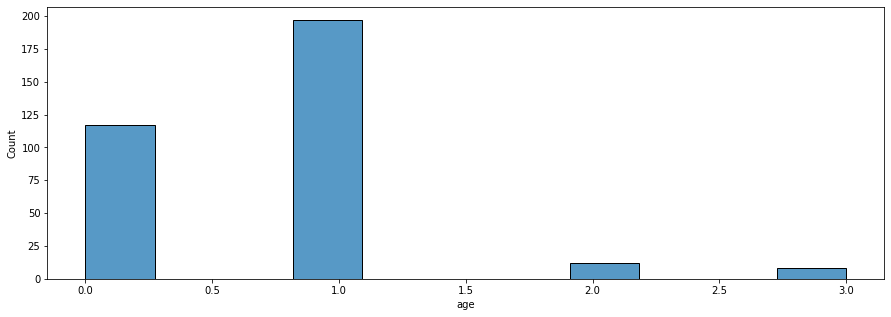

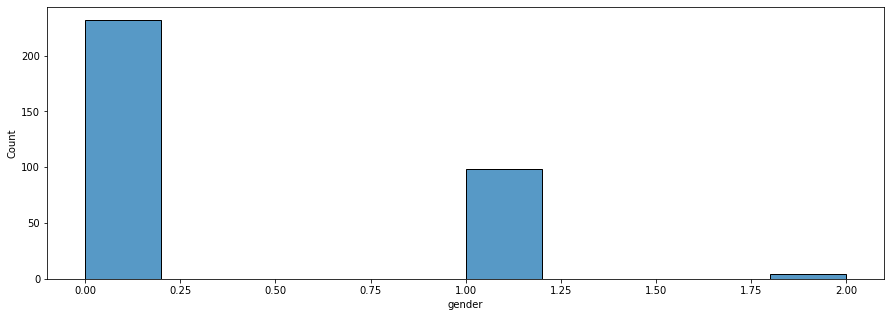

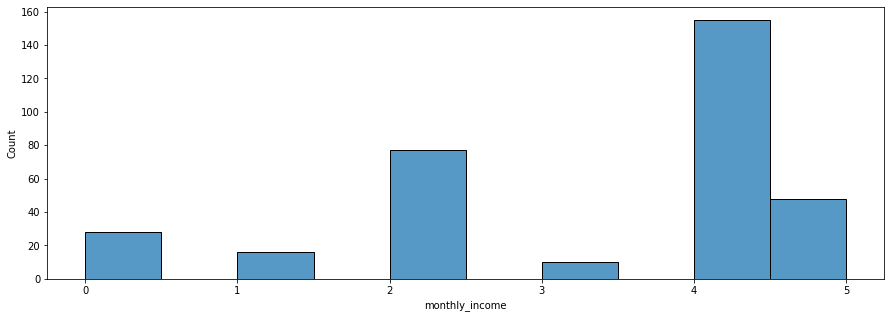

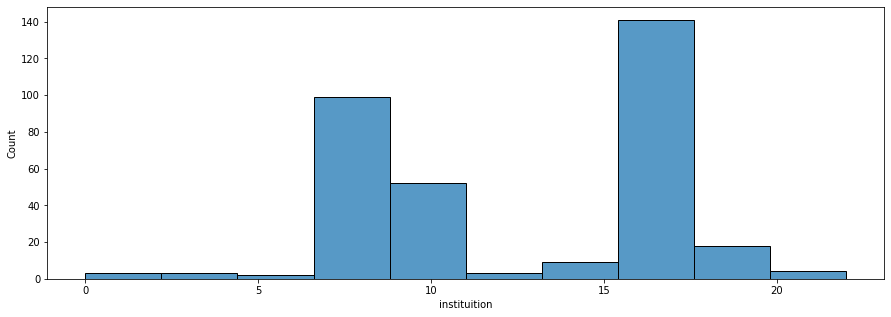

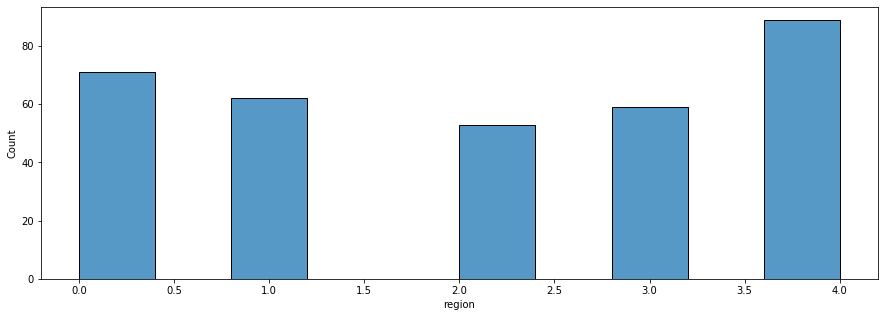

...

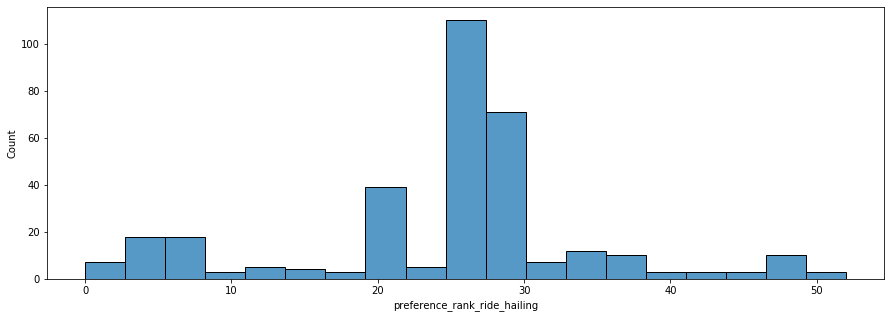

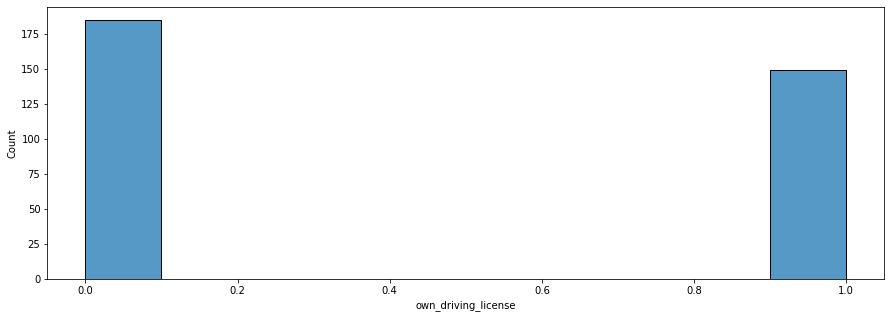

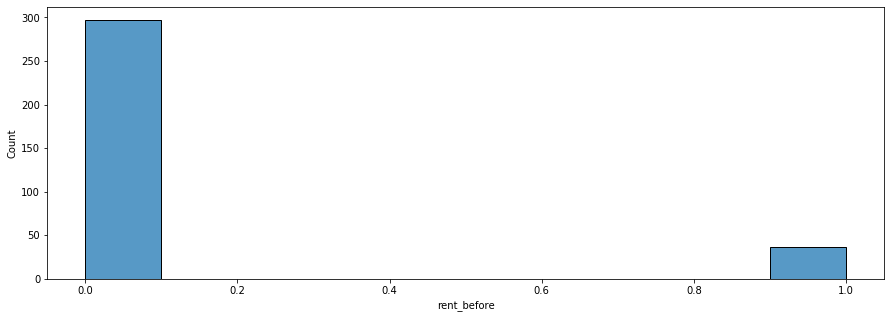

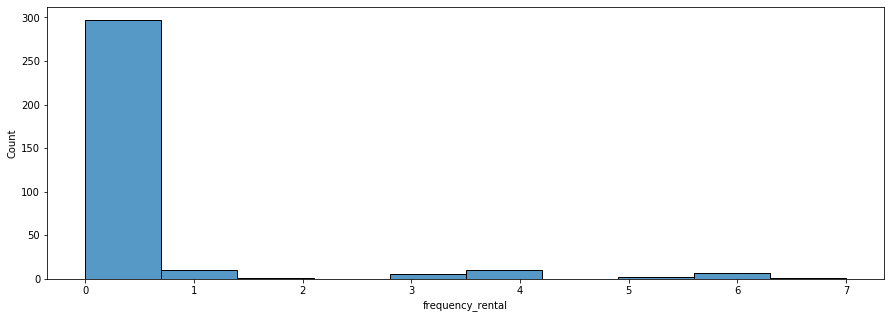

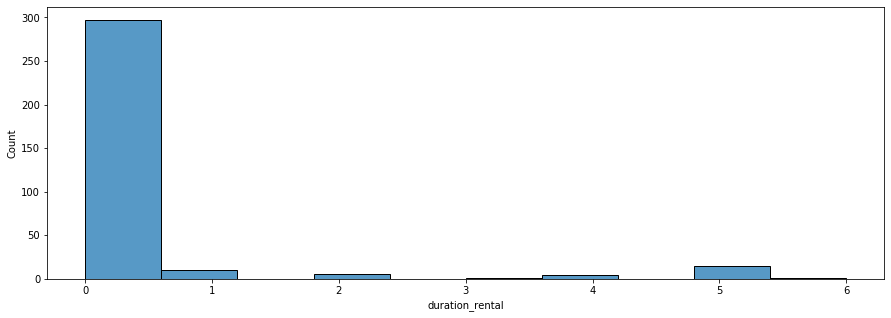

In [133]:
#checking of ditribuition 
all_features = travel_patterns.columns
for col in all_features:
    plt.subplots(figsize = (15,5))
    sns.histplot(data = travel_patterns, x=travel_patterns[col])
    plt.show()

In [134]:
travel_patterns.skew()

age                                   0.856712
gender                                1.091091
monthly_income                       -0.748466
instituition                         -0.152224
region                               -0.073863
location                              0.250519
type_of_student                       4.592400
type_of_employment                   -2.548440
frequently_used_mot                   0.567429
frequency_mot                         0.646453
factors_mot_ranking                   0.096528
overall_avg_spending                  0.239636
research                             -1.679372
comfortable                          -1.119267
explore                              -0.311928
frequently_used_mot_cnt               0.545166
frequency_bus                         0.924170
waiting_time_bus                     -0.078368
chartered_bus                         3.016910
reason_bus_travel_to_mrt_stations    -0.833571
reason_bus_recreation_destination    18.275667
reason_bus_fo

In [135]:
travel_perceptions.skew()

age                                                           0.856712
gender                                                        1.091091
monthly_income                                               -0.748466
instituition                                                 -0.152224
region                                                       -0.073863
location                                                      0.250519
type_of_student                                               4.592400
type_of_employment                                           -2.548440
preferred_mot                                                 0.462095
factors_mot_ranking                                           0.096528
most_preferred_mot                                            0.035732
least_preferred_mot                                           1.506505
affordable_bus                                               -0.881064
accesible_bus                                                -0.693950
safe_b

If the skewness is between -0.5 and 0.5, the data are fairly symmetrical

If the skewness is between -1 and – 0.5 or between 0.5 and 1, the data are moderately skewed

If the skewness is less than -1 or greater than 1, the data are highly skewed


A positively skewed distribution has a long tail on the right side and negatively skewed distribution has a long tail on the left side.

A right tailed distribution or a  positively skewed distribution has its mean greater than the median as the outliers present in the skewed right tail of the distribution influence the mean.

A left tailed distribution has its mean smaller than the median.

Conclusion: Doesnt make sense for us to address the skewness of respondent data because they are considered the insights.
    We can address skewness of independent variables  (age, gender, income) by adding more data points --> eg: need more males to fill up the survey etc
    
    
Further conclusion: No need to transform observed variables because in general they dont follow normal distribution. In our survey data, no distirbution to follow + no outlier in terms of age, gender, income which transformation can help to address

When data (or residuals) are not normal, the non-normality is often an important part of the research. If you transform it away, you are throwing away that critical piece.

In [136]:
# filter out those rented/did not rent
#rent_before = train_final[train_final['rent_before'] == 1]
#did_not_rent_before = train_final[train_final['rent_before'] == 0]

Correlation HeatMap

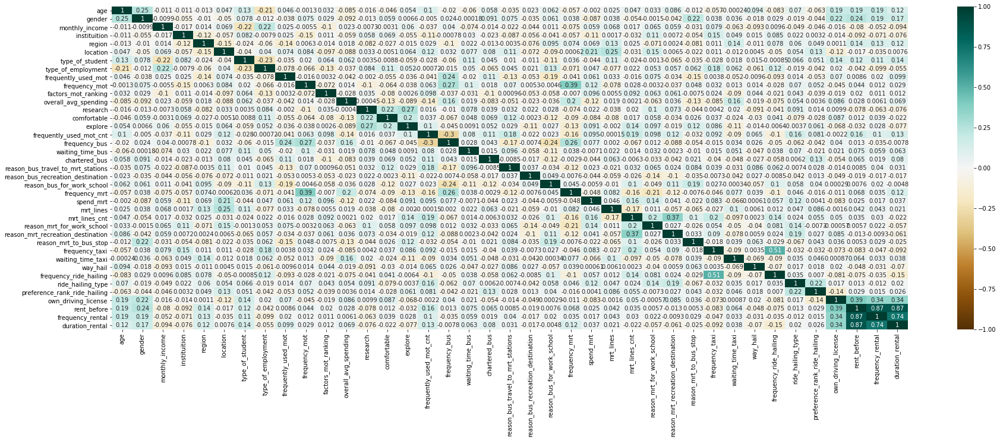

In [137]:
#Travel Patterns corr heatmap
plt.figure(figsize=(30,10))
sns.heatmap(travel_patterns.corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')

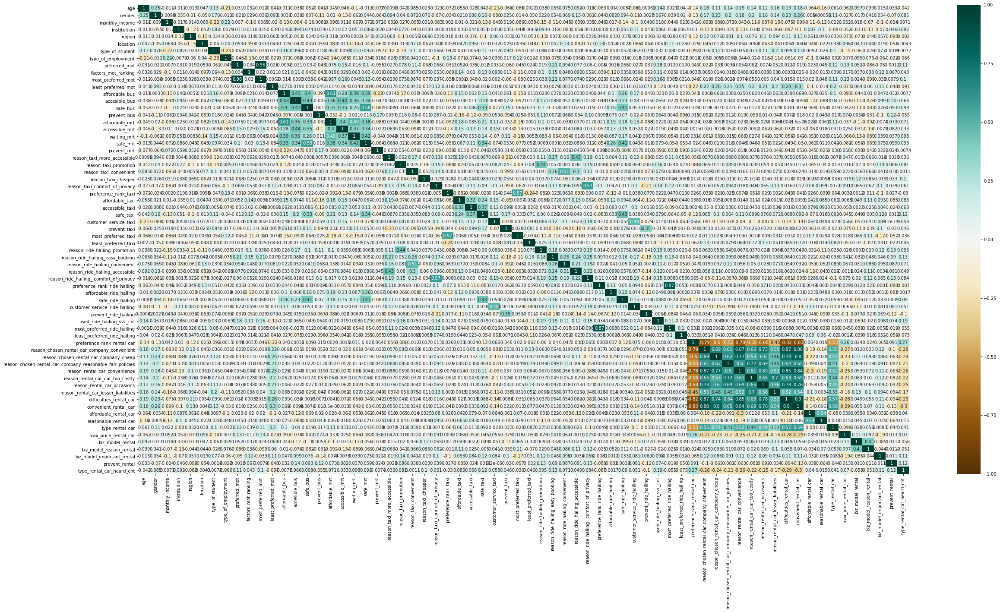

In [138]:
#Travel Perceptions/Preferences corr heatmap
plt.figure(figsize=(40,20))
sns.heatmap(travel_perceptions.corr(), vmin=-1, vmax=1, annot=True, cmap='BrBG')

In [139]:
#Drop unwanted columns that has extremely high correlation
#df.drop[#insert column, axis=1, inplace=True]

# FACTOR ANALYSIS

In [140]:
# pip install factor_analyzer

In [141]:
#Import and Install packages

#pip install factor_analyzer
from factor_analyzer import FactorAnalyzer

Adequacy Test - Evaluating the "factorability" of the dataset

Barlett's Test - Checks whether or not the observed variables intercorrelate at all using the observed correlation matrix against the identity matrix. If the test found statistically insignificant, you should not employ a factor analysis.

Kaiser-Meyer-Olkin (KMO) Test - Measures the suitability of data for factor analysis. Determines the adequacy for each observed variable and for the complete model. KMO estimates the proportion of variance among all the observed variable. 
    
        - Lower proportion id more suitable for factor analysis. 
        - KMO values range between 0 and 1. Less than 0.6 is considered inadequate. 


In [142]:
#Bartlett's Test - Travel patterns df

from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
patts_chi_square_value, patts_p_value = calculate_bartlett_sphericity(travel_patterns)
patts_chi_square_value, patts_p_value

(2498.0359943873837, 3.1243425520312414e-189)

In [143]:
#Bartlett's Test - Travel perceptions/preferences df

from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
percept_chi_square_value, percept_p_value = calculate_bartlett_sphericity(travel_perceptions)
percept_chi_square_value, percept_p_value

(9543.388938113096, 0.0)

In [144]:
#KMO Test - Travel patterns df

from factor_analyzer.factor_analyzer import calculate_kmo
patts_kmo_all, patts_kmo_model = calculate_kmo(travel_patterns)

patts_kmo_model

0.5872836388962259

In [145]:
#KMO Test - Travel perceptions/preferences df

from factor_analyzer.factor_analyzer import calculate_kmo
percept_kmo_all, percept_kmo_model = calculate_kmo(travel_perceptions)

percept_kmo_model

0.7307595925352718

Factor Analysis can only be done on the Travel Perceptions/Preferences df.

Bartlett's Results: p-value = 0.0 Hence, the was statistically significant, indicating that the observed correlation matrix is not an identity matrix.
KMO Results: Value of KMO is > 0.6: 0.7855376109339436. Hence, we may proceed with the planned factor analysis. 

As for Travel Patterns df, 
Bartlett's Results: p-value is close to 1. Hence, we will have ago to see an overall of it. 
KMO Results: Value of KMO is 0.579046764063662 (est. 0.6), not >0.6, but can try. 


FACTOR ANALYSIS ON TRAVEL PERCEPTIONS/PREFERENCES df

In [146]:
#Choosing the number of factors

#Create factor analysis object and perform factor analysis
fa_percept = FactorAnalyzer(55, rotation=None)
#fa.set_params(rotation=None)
fa_percept.fit(travel_perceptions)

#Check Eigenvalues
ev_percept, v_percept = fa_percept.get_eigenvalues()
ev_percept

C:\Users\user\Anaconda3\lib\site-packages\factor_analyzer\factor_analyzer.py:536: UserWarning: Failed to converge: b'STOP: TOTAL NO. of f AND g EVALUATIONS EXCEEDS LIMIT'
  warnings.warn('Failed to converge: {}'.format(res.message))


array([8.11248319, 4.36766294, 3.24489728, 2.28664028, 2.15235772,
       2.09626885, 1.93124433, 1.83134903, 1.7913775 , 1.70632935,
       1.5871254 , 1.51032376, 1.40022258, 1.37666836, 1.2776719 ,
       1.26420024, 1.21150608, 1.16175271, 1.0987228 , 1.07742228,
       1.04139418, 1.03162245, 0.98330804, 0.95621052, 0.92007046,
       0.90577645, 0.89048426, 0.86298264, 0.81166272, 0.80050545,
       0.75174259, 0.74026528, 0.72988511, 0.68158964, 0.6794936 ,
       0.64916759, 0.61894987, 0.59752914, 0.59482329, 0.56836736,
       0.54392438, 0.52250126, 0.50515035, 0.4954277 , 0.48268251,
       0.45896228, 0.43357078, 0.40655273, 0.38770095, 0.37305205,
       0.35573228, 0.33367377, 0.32386535, 0.29793967, 0.2791783 ,
       0.2495411 , 0.23800076, 0.21329944, 0.18929775, 0.13419878,
       0.12449967, 0.10262184, 0.09953648, 0.0713181 , 0.04526895,
       0.03044552])

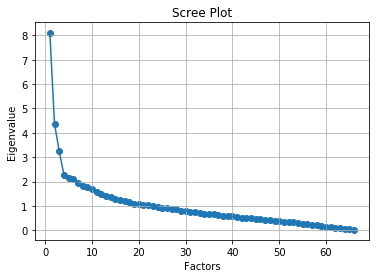

In [147]:
# Create scree plot using matplotlib
# WHAT IS THE 20 COLUMNS??? FIRST 20?? (what is the factor)

plt.scatter(range(1,travel_perceptions.shape[1]+1),ev_percept)
plt.plot(range(1,travel_perceptions.shape[1]+1),ev_percept)
plt.title('Scree Plot')
plt.xlabel('Factors')
plt.ylabel('Eigenvalue')
plt.grid()
plt.show()

In [148]:
# Create factor analysis object and perform factor analysis
fa_percept_varimax = FactorAnalyzer(20, rotation="varimax")
#fa.set_params(rotation="varimax")
fa_percept_varimax.fit(travel_perceptions)
fa_percept_varimax.loadings_

loadings_score_percept = pd.DataFrame(fa_percept_varimax.loadings_,index=travel_perceptions.columns)
loadings_score_percept.to_csv(r'../../../Data/Survey/travel_perceptions_loading_scores.csv')

In [149]:
# pip install pingouin

In [150]:
#!pip install pingouin
import pingouin as pg

#Create the factors

convenience = travel_perceptions[['convenient_rental_car', 'difficulties_rental_car', 'reason_chosen_rental_car_company_convenient','reason_rental_car_convenience', 'reason_rental_car_occasions']]
affordability = travel_perceptions[['affordable_bus', 'affordable_mrt']]
safety = travel_perceptions[['safe_taxi', 'safe_ride_hailing', 'safe_bus', 'safe_mrt']]
comfort = travel_perceptions[['reason_taxi_comfort_of_privacy', 'reason_ride_hailing_ comfort_of_privacy']]
promotion = travel_perceptions[['reason_ride_hailing_promotion', 'reason_taxi_promotion']]
customer_service = travel_perceptions[['customer_service_taxi','customer_service_ride_hailing']]
accessible = travel_perceptions[['reason_ride_hailing_accessible', 'reason_taxi_more_accessible', 'reason_ride_hailing_easy_booking']]


#accessibility = travel_perceptions[['convenient_rental_car', 'difficulties_rental_car','waiting_mrt','accesible_bus','accessible_mrt','accessible_taxi']]
#affordability = travel_perceptions[['affordable_mrt','affordable_bus','accessible_mrt','accesible_bus']]
#preferences = travel_perceptions[['preferred_mot','most_preferred_mot','preference_rank_ride_hailing','most_preferred_ride_hailing','most_preferred_taxi','preference_rank_taxi','least_preferred_taxi','prevent_taxi','prevent_ride_hailing']]
#motivation = travel_perceptions[['reasonable_rental_car','affordable_rental_car','biz_model_rental','biz_model_reason_rental','reason_taxi','reason_ride_hailing','type_rental_car','type_rental_car_heard_cnt']]
#satisfaction = travel_perceptions[['customer_service_taxi','customer_service_ride_hailing']]
#safety = travel_perceptions[['safe_taxi','safe_ride_hailing', 'safe_mrt','safe_bus']]


#Get cronbach alpha
#accessibility_alpha = pg.cronbach_alpha(accessibility)
convenience_alpha = pg.cronbach_alpha(convenience)
affordability_alpha = pg.cronbach_alpha(affordability)
safety_alpha = pg.cronbach_alpha(safety)
comfort_alpha = pg.cronbach_alpha(comfort)
promotion_alpha = pg.cronbach_alpha(promotion)
customer_service_alpha = pg.cronbach_alpha(customer_service)
accessible_alpha = pg.cronbach_alpha(accessible)


print("Convenience: " + str(convenience_alpha))
print("Affordability: " + str(affordability_alpha))
print("Safety: " + str(safety_alpha))
print("Comfort: " + str(comfort_alpha))
print("Promotion: " + str(promotion_alpha))
print("Customer Service: " + str(customer_service_alpha))
print("Accessible: " + str(accessible_alpha))

Convenience: (0.9310080616309302, array([0.919, 0.942]))
Affordability: (0.75849421948858, array([0.701, 0.805]))
Safety: (0.7368714667359193, array([0.688, 0.78 ]))
Comfort: (0.7277015437392782, array([0.662, 0.78 ]))
Promotion: (0.6063669606366966, array([0.512, 0.683]))
Customer Service: (0.6454830902073656, array([0.56 , 0.714]))
Accessible: (0.5798783690183512, array([0.495, 0.652]))


Even though we choose 20 as the optimal number of factors, some of the factors have similar and overlap variables and cronbach alpha not good enough (not more than 0.6) --> hence we have come to the conclusion of having 6 factors of travel perception

FACTOR ANALYSIS ON TRAVEL PATTERNS df

In [151]:
#Check for travel patterns df
travel_patterns

,age,gender,monthly_income,instituition,region,location,type_of_student,type_of_employment,frequently_used_mot,frequency_mot,factors_mot_ranking,overall_avg_spending,research,comfortable,explore,frequently_used_mot_cnt,frequency_bus,waiting_time_bus,chartered_bus,reason_bus_travel_to_mrt_stations,reason_bus_recreation_destination,reason_bus_for_work_school,frequency_mrt,spend_mrt,mrt_lines,mrt_lines_cnt,reason_mrt_for_work_school,reason_mrt_recreation_destination,reason_mrt_to_bus_stop,frequency_taxi,waiting_time_taxi,way_hail,frequency_ride_hailing,ride_hailing_type,preference_rank_ride_hailing,own_driving_license,rent_before,frequency_rental,duration_rental
0,1,0,4,17,2,38,0,2,23,3,10,1,9,9,1,2,3,2,0,1,0,1,0,3,93,1,1,1,0,3,0,10,4,20,29,1,0,0,0
1,1,0,4,17,4,3,0,1,14,0,255,3,6,3,4,4,0,0,0,1,0,1,4,2,59,3,1,1,0,4,0,13,1,22,20,1,1,4,5
2,1,1,4,16,4,3,0,2,5,2,186,1,8,7,6,3,2,2,0,1,0,1,1,2,49,3,1,1,0,3,2,16,4,21,25,1,0,0,0
3,0,0,4,17,1,30,0,2,1,2,74,1,10,10,10,2,0,2,0,1,0,1,1,2,24,1,1,1,0,3,0,8,3,15,20,0,0,0,0
4,1,0,5,15,1,21,0,2,23,0,67,1,7,7,7,2,0,2,0,0,0,0,0,2,61,1,1,0,0,3,0,13,3,15,30,0,0,0,0
5,1,0,4,9,2,21,0,2,1,0,157,1,8,9,5,2,0,2,0,1,0,0,0,1,93,1,1,0,0,0,2,13,4,20,25,0,0,0,0
6,1,0,4,8,4,8,0,2,23,0,129,1,8,5,10,2,0,0,0,1,0,1,0,2,73,3,1,1,0,3,3,13,3,15,25,0,0,0,0
7,0,0,2,8,4,13,0,2,23,2,84,1,8,8,7,2,2,0,0,0,0,1,2,0,61,1,1,1,0,3,0,13,3,21,25,1,0,0,0
8,0,1,5,18,3,22,0,2,26,2,162,1,8,9,8,3,2,2,0,1,0,0,2,1,78,1,1,0,0,4,0,13,4,21,25,0,0,0,0
9,0,0,2,8,1,1,0,2,26,2,5,1,7,7,5,3,0,2,0,1,0,1,0,2,10,3,1,1,0,4,0,13,4,27,48,0,0,0,0


In [152]:
#Choosing the number of factors

#Create factor analysis object and perform factor analysis
fa_patts = FactorAnalyzer(33, rotation=None)
#fa.set_params(rotation=None)
fa_patts.fit(travel_patterns)

#Check Eigenvalues
ev_patts, v_patts = fa_patts.get_eigenvalues()
ev_patts

array([3.23570307, 2.44206718, 1.87464904, 1.75768866, 1.69977679,
       1.62593969, 1.53272447, 1.48377932, 1.41354932, 1.33960637,
       1.19921595, 1.18534356, 1.09385809, 1.07847546, 1.01300229,
       0.97947302, 0.95993853, 0.91901975, 0.91083387, 0.86637147,
       0.8225579 , 0.80620469, 0.77141987, 0.75856029, 0.7278023 ,
       0.70479365, 0.63455956, 0.58654476, 0.58357499, 0.56540795,
       0.54621517, 0.5233171 , 0.4746031 , 0.43995796, 0.42417781,
       0.39103633, 0.34273946, 0.2156842 , 0.06982701])

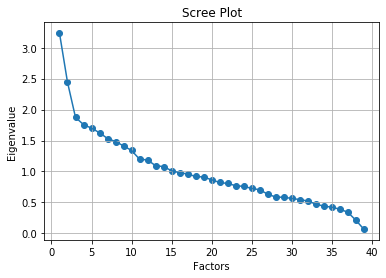

In [153]:
# Create scree plot using matplotlib
plt.scatter(range(1,travel_patterns.shape[1]+1),ev_patts)
plt.plot(range(1,travel_patterns.shape[1]+1),ev_patts)
plt.title('Scree Plot')
plt.xlabel('Factors')
plt.ylabel('Eigenvalue')
plt.grid()
plt.show()

In [154]:
# Create factor analysis object and perform factor analysis
fa_patts_varimax = FactorAnalyzer(15, rotation="varimax")
#fa.set_params(rotation="varimax")
fa_patts_varimax.fit(travel_patterns)
fa_patts_varimax.loadings_

loadings_score_patts = pd.DataFrame(fa_patts_varimax.loadings_,index=travel_patterns.columns)
loadings_score_patts.to_csv(r'../../../Data/Survey/travel_patterns_loading_scores.csv')

In [155]:
#Create the factors

frequency_taxi_ride_hailing = travel_patterns[['frequency_ride_hailing', 'frequency_taxi']]
overall_frequency = travel_patterns[['frequency_mot', 'frequency_mrt', 'frequency_bus']]


#Get cronbach alpha
frequency_taxi_ride_hailing_alpha = pg.cronbach_alpha(frequency_taxi_ride_hailing)
overall_frequency_alpha = pg.cronbach_alpha(overall_frequency)

print(frequency_taxi_ride_hailing_alpha, overall_frequency_alpha)

(0.665196232339089, array([0.585, 0.73 ])) (0.5500366840425, array([0.459, 0.628]))


Conclusion: Survey + factor analysis result show more focus on perception 
    --> hence we will proceed with travel perception only for clustering since travel patterns consist of one factor only

# PREPARE TRAVEL PERCEPTION DATASET FOR CLUSTERING

In [156]:
perception_dataset= pd.concat([train_final[demo_cols], convenience, affordability,safety,comfort,promotion, customer_service, accessible], axis=1)
#pattern_dataset = pd.concat([train_final[demo_cols], frequency_taxi_ride_hailing],axis=1)
perception_dataset.to_csv(r'../../../Data/Survey/perception_dataset.csv', index=False)
#pattern_dataset.to_csv('pattern_dataset.csv')

In [157]:
perception_dataset.head()

,age,gender,monthly_income,instituition,region,location,type_of_student,type_of_employment,convenient_rental_car,difficulties_rental_car,reason_chosen_rental_car_company_convenient,reason_rental_car_convenience,reason_rental_car_occasions,affordable_bus,affordable_mrt,safe_taxi,safe_ride_hailing,safe_bus,safe_mrt,reason_taxi_comfort_of_privacy,reason_ride_hailing_ comfort_of_privacy,reason_ride_hailing_promotion,reason_taxi_promotion,customer_service_taxi,customer_service_ride_hailing,reason_ride_hailing_accessible,reason_taxi_more_accessible,reason_ride_hailing_easy_booking
0,1,0,4,17,2,38,0,2,0,0,0,0,0,1,1,1,1,2,1,0,0,1,1,0,0,1,1,0
1,1,0,4,17,4,3,0,1,1,1,1,1,1,1,1,1,1,1,1,0,0,1,1,1,2,0,0,1
2,1,1,4,16,4,3,0,2,0,0,0,0,0,1,1,2,1,1,1,0,0,1,0,1,2,1,0,1
3,0,0,4,17,1,30,0,2,0,0,0,0,0,1,1,1,0,1,1,0,0,1,1,2,1,0,1,0
4,1,0,5,15,1,21,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [158]:
#pattern_dataset